# Etapas
1. Entendimento do Problema;
2. Aquisição e Entendimento dos Dados;
3. Tratamento dos Dados;
4. Análise Exploratória de Dados;
5. Segmentando a base com K-Means;
6. Definição da Arquitetura, Criação da Rede e Execução do Modelo;
7. Avaliando os Modelos: Sumários, Métricas e Conclusões.

# 1. Entendimento do Problema
- Para esse projeto tive o desejo de aprender a unir algoritmos não-supervisionados com supervisionados, rotulando uma base para depois treinar um algoritmo que possa predizer esses rótulos em novos casos, como estou em uma etapa de aprendizado em que estou focando em deep learning optei por inserir uma rede neural que possa classificar esses rótulos;
- Fiz algumas pesquisas em datasets de áreas do conhecimento que possam me interessar e me deparei com o dataset San Francisco Police Department Incidents do Google BigQuery, esse dataset contém mais de 2 milhões de incidentes que vão dos anos de 2003 a 2018 e temos informações da categoria do crime, descrições, datas e resoluções de cada incidente;
- Serão realizados tratamentos e feature engineering para a EDA;
- Na parte de Análise Exploratória pretendo explorar a fundo os principais casos, principais resoluções, análises temporais e análises geográficas com criação de heatmaps em mapas de rua mostrando os locais com mais incidentes e informações úteis sobre esses incidentes (Mapas Interativos);
- Ao fim essa base será rotulada e uma rede neural será criada e treinada para predizer os rótulos, em ambos algorítmos serão testados diferentes hiperparâmetros para a execução de um modelo que traga melhores resultados.

### Data Dictionary

| **Feature** | **Data Type**   | **Description**                                                                 |
|-------------------|------------|-------------------------------------------------------------------------------|
| `unique_key`      | INTEGER    | Identificador único para cada incidente de crime registrado.                  |
| `category`        | STRING     | Categoria geral do crime cometido (e.g., "ASSAULT", "ROBBERY").               |
| `descript`        | STRING     | Descrição detalhada do crime (e.g., "GRAND THEFT FROM LOCKED AUTO").          |
| `dayofweek`       | STRING     | Dia da semana em que o crime ocorreu (e.g., "Monday", "Tuesday").             |
| `pddistrict`      | STRING     | Distrito do Departamento de Polícia onde o crime foi registrado.              |
| `resolution`      | STRING     | Resultado ou resolução do incidente (e.g., "ARREST, BOOKED", "NONE").         |
| `address`         | STRING     | Endereço onde o crime ocorreu.                                                |
| `longitude`       | FLOAT      | Coordenada geográfica de longitude do local onde o crime ocorreu.             |
| `latitude`        | FLOAT      | Coordenada geográfica de latitude do local onde o crime ocorreu.              |
| `location`        | STRING     | Localização combinada em formato de string (Latitude/Longitude).              |
| `pdid`            | INTEGER    | Identificador único para operações de atualização e inserção no dataset.      |
| `timestamp`       | TIMESTAMP  | Data e hora em que o crime foi registrado.                                    |


# 2. Aquisição e Entendimento dos Dados

In [5]:
from google.cloud import bigquery
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.colors as pc
#import scipy.stats as stats
import re

import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "composite-keel-371920-24c2737df989.json"

import warnings
warnings.filterwarnings('ignore')

# Configurando objetos Pandas DataFrame e Numpy Arrays para exibirem todas as informações
np.set_printoptions(threshold=np.inf)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Configurando estilo e paleta de cores que serão utilizadas nos gráficos
sns.set_theme(style="whitegrid", palette="viridis")
sns.color_palette('viridis')

[(0.275191, 0.194905, 0.496005),
 (0.212395, 0.359683, 0.55171),
 (0.153364, 0.497, 0.557724),
 (0.122312, 0.633153, 0.530398),
 (0.288921, 0.758394, 0.428426),
 (0.626579, 0.854645, 0.223353)]

In [6]:
# Configurar o cliente BigQuery
client = bigquery.Client()

# Definir a consulta SQL
query = f'''SELECT * FROM `bigquery-public-data.san_francisco.sfpd_incidents`'''

# Executar a consulta e obter os resultados
query_job = client.query(query)
df_big_query = query_job.to_dataframe()

# Salvando em csv
df_big_query.to_csv('sfpd_incidents.csv')

### Leitura dos Dados

In [8]:
df = pd.read_csv('sfpd_incidents.csv')
df.drop('Unnamed: 0', axis='columns', inplace=True)

In [9]:
df.head(2)

,unique_key,category,descript,dayofweek,pddistrict,resolution,address,longitude,latitude,location,pdid,timestamp
0,100201225,FRAUD,"ACCESS CARD INFORMATION, THEFT OF",Thursday,PARK,NONE,1400 Block of WALLER ST,-122.447968,37.768863,"(37.768862804, -122.44796773714)",10020122509164,2010-02-25 20:00:00+00:00
1,60202989,VANDALISM,"MALICIOUS MISCHIEF, FICTITIOUS PHONE CALLS",Tuesday,PARK,NONE,200 Block of CRESTMONT DR,-122.459716,37.756650,"(37.75664997762, -122.45971647828)",6020298928130,2006-02-21 15:28:00+00:00


### Informações Gerais dos Dados

In [11]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2170785 entries, 0 to 2170784
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   unique_key  2170785 non-null  int64  
 1   category    2170785 non-null  object 
 2   descript    2170785 non-null  object 
 3   dayofweek   2170785 non-null  object 
 4   pddistrict  2170784 non-null  object 
 5   resolution  2170785 non-null  object 
 6   address     2170785 non-null  object 
 7   longitude   2170785 non-null  float64
 8   latitude    2170785 non-null  float64
 9   location    2170785 non-null  object 
 10  pdid        2170785 non-null  int64  
 11  timestamp   2170785 non-null  object 
dtypes: float64(2), int64(2), object(8)
memory usage: 198.7+ MB


### Verificação de Dados Nulos

unique_key    0.000000e+00
category      0.000000e+00
descript      0.000000e+00
dayofweek     0.000000e+00
pddistrict    4.606628e-07
resolution    0.000000e+00
address       0.000000e+00
longitude     0.000000e+00
latitude      0.000000e+00
location      0.000000e+00
pdid          0.000000e+00
timestamp     0.000000e+00
dtype: float64

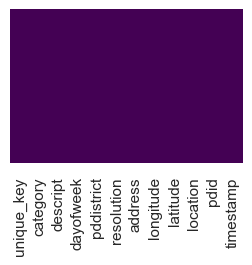

In [13]:
plt.figure(figsize=(3,2))
sns.heatmap(df.isnull(),
            yticklabels=False,
            cbar=False,
            cmap='viridis')
df.isnull().sum() / len(df)

### Verificação de Dados Infinitos

unique_key    0
longitude     0
latitude      0
pdid          0
dtype: int64

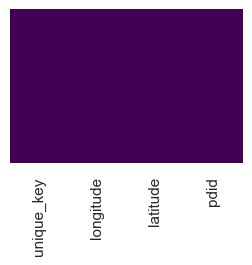

In [15]:
plt.figure(figsize=(3,2))
sns.heatmap(np.isinf(df.select_dtypes(include=['number'])),
            yticklabels=False,
            cbar=False,
            cmap='viridis')
np.isinf(df.select_dtypes(include=['number'])).sum()

### Dados Categóricos - Verificando distribuição e existência de valores fora do domínio esperado

In [17]:
columns = ['category','dayofweek','pddistrict','resolution']

In [18]:
for column in columns:
    display(df[column].value_counts())
    print(f'\n\n')

category
LARCENY/THEFT                  467657
OTHER OFFENSES                 304042
NON-CRIMINAL                   233323
ASSAULT                        190394
VEHICLE THEFT                  125209
DRUG/NARCOTIC                  118260
VANDALISM                      113436
WARRANTS                        99799
BURGLARY                        89528
SUSPICIOUS OCC                  78823
MISSING PERSON                  63706
ROBBERY                         54854
FRAUD                           40733
SECONDARY CODES                 25223
FORGERY/COUNTERFEITING          22839
WEAPON LAWS                     21698
TRESPASS                        18959
PROSTITUTION                    16652
STOLEN PROPERTY                 11645
SEX OFFENSES, FORCIBLE          11411
DISORDERLY CONDUCT               9950
DRUNKENNESS                      9746
RECOVERED VEHICLE                8714
DRIVING UNDER THE INFLUENCE      5593
KIDNAPPING                       5275
RUNAWAY                          4355
LIQ

dayofweek
Friday       331007
Wednesday    317739
Saturday     313869
Thursday     309655
Tuesday      309179
Monday       300609
Sunday       288727
Name: count, dtype: int64

pddistrict
SOUTHERN      391669
MISSION       293940
NORTHERN      266869
CENTRAL       220420
BAYVIEW       217097
INGLESIDE     190593
TENDERLOIN    189017
TARAVAL       163620
PARK          123110
RICHMOND      114449
Name: count, dtype: int64

resolution
NONE                                      1356705
ARREST, BOOKED                             514120
ARREST, CITED                              154784
LOCATED                                     34463
PSYCHOPATHIC CASE                           29185
UNFOUNDED                                   23517
JUVENILE BOOKED                             13907
COMPLAINANT REFUSES TO PROSECUTE             8089
DISTRICT ATTORNEY REFUSES TO PROSECUTE       7955
NOT PROSECUTED                               7720
JUVENILE CITED                               6586
PROSECUTED BY OUTSIDE AGENCY                 5070
EXCEPTIONAL CLEARANCE                        4224
JUVENILE ADMONISHED                          3004
JUVENILE DIVERTED                             694
CLEARED-CONTACT JUVENILE FOR MORE INFO        678
PROSECUTED FOR LESSER OFFENSE                  84
Name: count, dtype: int64

In [19]:
df['descript'].nunique()

915

- Foram encontradas 915 diferentes categorias para as descrições dos crimes, segue abaixo algumas amostras:

In [21]:
df['descript'].value_counts().sample(5)

descript
STOLEN TRAILER                                       129
POSSESSION OF BURGLARY TOOLS W/PRIORS                355
EMBEZZLEMENT, GRAND THEFT PRIVATE PROPERTY            19
MAINTAINING A PUBLIC NUISANCE AFTER NOTIFICATION    1737
THEFT, DRUNK ROLL, $200-$400                          47
Name: count, dtype: int64

# 3. Tratamento dos Dados
Nesta etapa será realizado: 
- Feature Engineering (timestamp): Conversão da variável tempo para o tipo datetime e extração do dia, mes, ano, hora e minuto em variáveis separadas para análises temporais;
- Feature Engineering (address): Extração da rua e bloco para variáveis separadas com intuito de análises pontuais em determinadas regiões.
- Feature Engineering (isweekend): Variável binária indicando se é final de semana ou não.
- Foram localizados dados nulos na variável 'pddistrict', porém sua existência equivale a 4.606628e-07 do percentual total de dados. A princípio será removido para evitar possíveis problemas na execução de futuras análises.


In [23]:
df.dropna(subset=['pddistrict'], inplace=True)

In [24]:
df['is_weekend'] = df['dayofweek'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)

In [25]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [26]:
df['timestamp'][:5]

0   2010-02-25 20:00:00+00:00
1   2006-02-21 15:28:00+00:00
2   2006-10-26 00:16:00+00:00
3   2015-09-02 09:52:00+00:00
4   2006-03-29 15:45:00+00:00
Name: timestamp, dtype: datetime64[ns, UTC]

In [27]:
df['time'] = df['timestamp'].dt.time
df['day'] = df['timestamp'].dt.day
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

In [28]:
df['address'].sample(5)

2150494     800 Block of BRYANT ST
1762566      1800 Block of PINE ST
28064      2300 Block of MARKET ST
2156419     600 Block of NAPLES ST
1679828       4TH ST / HARRISON ST
Name: address, dtype: object

In [29]:
# Função para extrair número e nome da rua
def extract_address_components(address):
    # Regex para capturar padrões de "Block" e ruas
    block_pattern = r'(\d+) Block of (\w+ \w+|\w+)(?: AV| DR| ST)'
    
    # Regex para capturar interseções (opcional)
    intersection_pattern = r'(\w+ \w+|\w+) / (\w+ \w+|\w+)'
    
    # Tentativa de combinar com padrões conhecidos
    if re.search(block_pattern, address):
        match = re.search(block_pattern, address)
        return pd.Series({'number': match.group(1), 'street': match.group(2)})
    elif re.search(intersection_pattern, address):
        match = re.search(intersection_pattern, address)
        # Aqui você poderia lidar com interseções, se necessário
        return pd.Series({'number': 'Not Informed', 'street': match.group(1) + " / " + match.group(2)})
    else:
        return pd.Series({'number': 'Not Informed', 'street': address})

# Aplicando a função para criar novas colunas
df[['number', 'street']] = df['address'].apply(extract_address_components)

In [30]:
# Reorganizando as colunas criadas
df = df[['unique_key', 'pdid', 'category', 'descript', 'resolution', 'pddistrict', 'address', 'number', 'street',
         'longitude', 'latitude', 'location', 'timestamp', 'dayofweek', 'time', 'day', 'month', 'year', 'is_weekend']]
df.sample(5)

,unique_key,pdid,category,descript,resolution,pddistrict,address,number,street,longitude,latitude,location,timestamp,dayofweek,time,day,month,year,is_weekend
2030662,170250531,17025053162050,WARRANTS,ENROUTE TO OUTSIDE JURISDICTION,"ARREST, BOOKED",MISSION,1700 Block of MISSION ST,1700,MISSION,-122.419877,37.769580,"(37.76957974718961, -122.41987691713402)",2017-03-27 11:52:00+00:00,Monday,11:52:00,27,3,2017,0
270874,100121980,10012198063010,WARRANTS,WARRANT ARREST,JUVENILE BOOKED,INGLESIDE,OCEAN AV / OTSEGO AV,Not Informed,OCEAN AV / OTSEGO AV,-122.441049,37.723342,"(37.7233420393287, -122.441049163425)",2010-01-06 02:39:00+00:00,Wednesday,02:39:00,6,1,2010,0
479600,160960079,16096007916650,DRUG/NARCOTIC,POSSESSION OF METH-AMPHETAMINE,"ARREST, BOOKED",MISSION,2500 Block of ALAMEDA ST,2500,ALAMEDA,-122.409752,37.768292,"(37.76829196156317, -122.40975199970647)",2016-11-25 18:14:00+00:00,Friday,18:14:00,25,11,2016,0
1422169,160375707,16037570765015,OTHER OFFENSES,TRAFFIC VIOLATION,"ARREST, BOOKED",CENTRAL,COLUMBUS AV / STOCKTON ST,Not Informed,COLUMBUS AV / STOCKTON ST,-122.409017,37.799488,"(37.799488071763285, -122.40901700761329)",2016-05-07 17:57:00+00:00,Saturday,17:57:00,7,5,2016,1
2022756,130038678,13003867806244,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,NONE,MISSION,21ST ST / FAIROAKS ST,Not Informed,21ST ST / FAIROAKS ST,-122.424445,37.756701,"(37.7567012911543, -122.424445121078)",2013-01-14 13:30:00+00:00,Monday,13:30:00,14,1,2013,0


# Salvando Mudanças
- Este processo é necessário pois estou lidando com mais de 2 milhões de instâncias e o tempo de execução de certas células tem sido longo.


In [32]:
df.to_csv('sfpd_incidents.csv', index=False)

In [33]:
df = pd.read_csv('sfpd_incidents.csv')

# 4. Análise Exploratória de Dados
Nesta EDA serão focadas as seguintes análises:
- Estatísticas Descritivas e Distribuição das Features, perguntas como: Quais crimes são mais comuns? Quais são as principais resoluções desses crimes?
- Análises Geográficas utilizando plotly, perguntas como: Quais locais ocorreram mais crimes?
- Análises Temporais com as features relacionadas ao tempo criadas na etapa anterior, perguntas como: Quais meses temos mais furtos? Quais horários temos mais incidentes acontecendo? Qual foi o ano que ocorreram mais crimes?

### Estatísticas Descritivas e Distribuição das Features:

In [36]:
df.describe(include='object').transpose()

,count,unique,top,freq
category,2170784,39,LARCENY/THEFT,467656
descript,2170784,915,GRAND THEFT FROM LOCKED AUTO,173078
resolution,2170784,17,NONE,1356704
pddistrict,2170784,10,SOUTHERN,391669
address,2170784,25123,800 Block of BRYANT ST,64271
number,2170784,75,Not Informed,749465
street,2170784,16656,BRYANT,69929
location,2170784,60767,"(37.775420706711, -122.403404791479)",55669
timestamp,2170784,960695,2011-01-01 00:01:00+00:00,185
dayofweek,2170784,7,Friday,331007


### Quais são os crimes mais comuns e quais <u>resoluções</u> esses crimes tiveram?

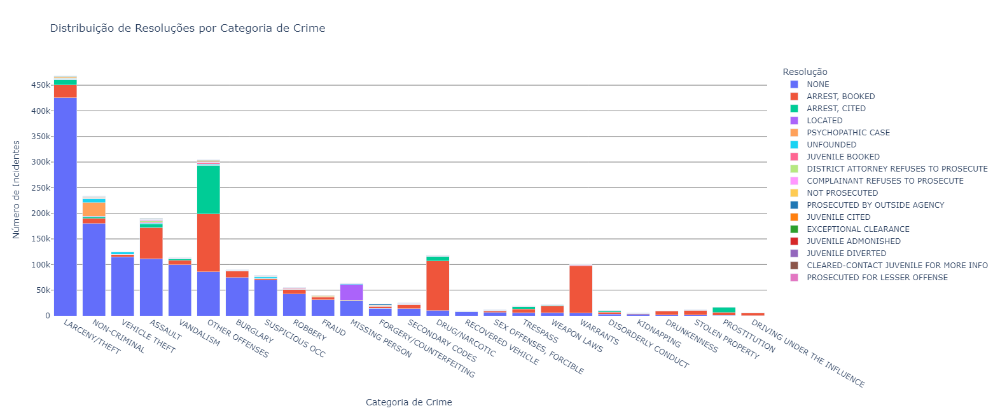

In [38]:
# Agrupar os dados pela categoria de crime e resolução
grouped_data_resolutions = df.groupby(['category', 'resolution']).size().reset_index(name='count')

# Selecionar as top 10 categorias de crimes mais comuns
top_10_categories = df['category'].value_counts().nlargest(25).index
grouped_data_resolutions = grouped_data_resolutions[grouped_data_resolutions['category'].isin(top_10_categories)]

# Definir uma paleta de 17 cores distintas
custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', 
                 '#FF6692', '#B6E880', '#FF97FF', '#FECB52', '#1F77B4', '#FF7F0E', 
                 '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2']

# Criar o gráfico de barras empilhadas com Plotly
fig = px.bar(grouped_data_resolutions.sort_values(by='count', ascending=False), 
             x='category', 
             y='count',
             color='resolution', 
             title='Distribuição de Resoluções por Categoria de Crime',
             labels={'category': 'Categoria de Crime', 'count': 'Número de Incidentes', 'resolution': 'Resolução'},
             color_discrete_sequence=custom_colors)  # Você pode escolher outras sequências de cores

# Personalizar o layout
fig.update_layout(barmode='stack',
                  height=650,
                  xaxis_title='Categoria de Crime',
                  yaxis_title='Número de Incidentes',
                  plot_bgcolor='white', 
                  yaxis=dict(showgrid=True, gridcolor='gray'))

# Exibir o gráfico
fig.show()

In [39]:
df['category'].value_counts()[:10]

category
LARCENY/THEFT     467656
OTHER OFFENSES    304042
NON-CRIMINAL      233323
ASSAULT           190394
VEHICLE THEFT     125209
DRUG/NARCOTIC     118260
VANDALISM         113436
WARRANTS           99799
BURGLARY           89528
SUSPICIOUS OCC     78823
Name: count, dtype: int64

### Nesses crimes mais comuns, em quais <u>distritos</u> eles ocorrem ?

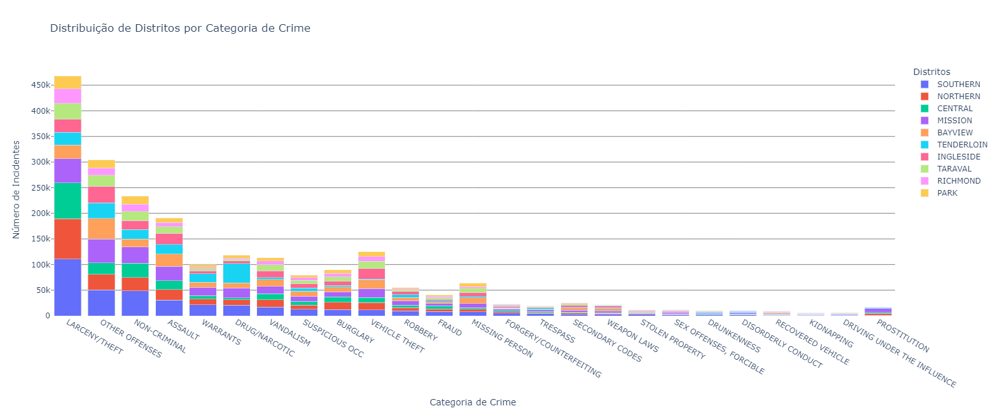

In [41]:
# Agrupar os dados pela categoria de crime e distritos
grouped_data_district = df.groupby(['category', 'pddistrict']).size().reset_index(name='count')

# Selecionar as top 10 categorias de crimes mais comuns
top_10_categories = df['category'].value_counts().nlargest(25).index
grouped_data_district = grouped_data_district[grouped_data_district['category'].isin(top_10_categories)]

# Definir uma paleta de 17 cores distintas
custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', 
                 '#FF6692', '#B6E880', '#FF97FF', '#FECB52', '#1F77B4', '#FF7F0E', 
                 '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2']

# Criar o gráfico de barras empilhadas com Plotly
fig = px.bar(grouped_data_district.sort_values(by='count', ascending=False), 
             x='category', 
             y='count',
             color='pddistrict', 
             title='Distribuição de Distritos por Categoria de Crime',
             labels={'category': 'Categoria de Crime', 'count': 'Número de Incidentes', 'pddistrict': 'Distritos'},
             color_discrete_sequence=custom_colors)  # Você pode escolher outras sequências de cores

# Personalizar o layout
fig.update_layout(barmode='stack',
                  height=650,
                  xaxis_title='Categoria de Crime',
                  yaxis_title='Número de Incidentes',
                  plot_bgcolor='white', 
                  yaxis=dict(showgrid=True, gridcolor='gray'))

# Exibir o gráfico
fig.show()

In [42]:
df['pddistrict'].value_counts()

pddistrict
SOUTHERN      391669
MISSION       293940
NORTHERN      266869
CENTRAL       220420
BAYVIEW       217097
INGLESIDE     190593
TENDERLOIN    189017
TARAVAL       163620
PARK          123110
RICHMOND      114449
Name: count, dtype: int64

### Conclusões:
- `Southern District` foi o local onde mais roubos, notoriamente também discussões onde ofensas foram proferidas também ocorreram. Este distrito também em relação aos outros ocorre diversos outros tipos de incidentes com uma escala superior a outros.
- Em relação ao consumo e venda de drogas, o distrito de `TENDERLIOIN` lidera a quantidade de incidentes, com números acima de 37 mil incidentes.
- No distrito de `MISSION` tivemos uma notável quantidade de assaltos, quase empatando com o distrito Sul. 

In [44]:
df.head(1)

,unique_key,pdid,category,descript,resolution,pddistrict,address,number,street,longitude,latitude,location,timestamp,dayofweek,time,day,month,year,is_weekend
0,100201225,10020122509164,FRAUD,"ACCESS CARD INFORMATION, THEFT OF",NONE,PARK,1400 Block of WALLER ST,1400,WALLER,-122.447968,37.768863,"(37.768862804, -122.44796773714)",2010-02-25 20:00:00+00:00,Thursday,20:00:00,25,2,2010,0


### Continuando nos crimes mais comuns, quais são suas <u>principais</u> descrições? (que <u>tipo</u> de assalto foi realizado por exemplo?)

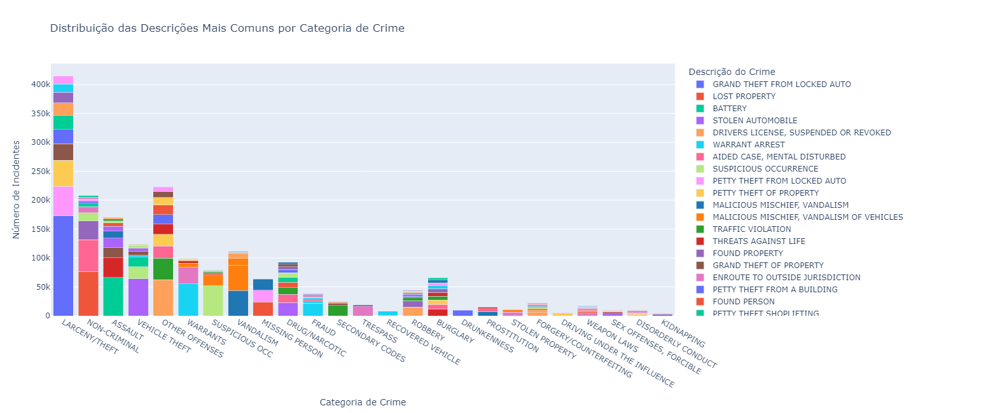

In [46]:
# Agrupar os dados pela categoria de crime e descrição, e contar as ocorrências
grouped_data = df.groupby(['category', 'descript']).size().reset_index(name='count')

# Selecionar as top 25 categorias de crimes mais comuns
top_25_categories = df['category'].value_counts().nlargest(25).index

# Filtrar os dados para as 25 categorias mais comuns
filtered_data = grouped_data[grouped_data['category'].isin(top_25_categories)]

# Filtrar as top 10 descrições mais comuns para cada uma das 25 categorias principais
top_descriptions = []
for category in top_25_categories:
    category_data = filtered_data[filtered_data['category'] == category]
    top_descriptions.append(category_data.nlargest(10, 'count'))

# Concatenar todos os DataFrames em um só
grouped_data_top = pd.concat(top_descriptions).reset_index(drop=True)

# Criar o gráfico de barras empilhadas com Plotly
fig = px.bar(grouped_data_top.sort_values(by='count', ascending=False), 
             x='category', 
             y='count',
             color='descript', 
             title='Distribuição das Descrições Mais Comuns por Categoria de Crime',
             labels={'category': 'Categoria de Crime', 'count': 'Número de Incidentes', 'descript': 'Descrição do Crime'},
             color_discrete_sequence=custom_colors)

# Personalizar o layout
fig.update_layout(barmode='stack',
                  height=650,
                  xaxis_title='Categoria de Crime',
                  yaxis_title='Número de Incidentes')

# Exibir o gráfico
fig.show()

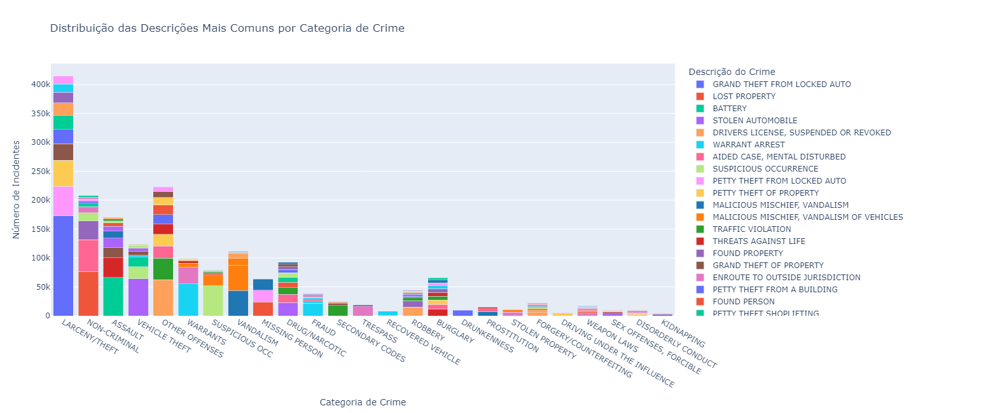

In [47]:
# Filtrar as top 10 descrições mais comuns para cada uma das 25 categorias principais
def get_top_descriptions(group, top_n=10):
    return group.nlargest(top_n, 'count')

grouped_data_descriptions = grouped_data.groupby('category', group_keys=False).apply(get_top_descriptions)

# Criar o gráfico de barras empilhadas com Plotly
fig = px.bar(grouped_data_top.sort_values(by='count', ascending=False), 
             x='category', 
             y='count',
             color='descript', 
             title='Distribuição das Descrições Mais Comuns por Categoria de Crime',
             labels={'category': 'Categoria de Crime', 'count': 'Número de Incidentes', 'descript': 'Descrição do Crime'},
             color_discrete_sequence=custom_colors)

# Personalizar o layout
fig.update_layout(barmode='stack',
                  height=650,
                  xaxis_title='Categoria de Crime',
                  yaxis_title='Número de Incidentes')

# Renderizar com tamanho fixo
from IPython.display import display, HTML

display(HTML('<style>.container { width:100% !important; }</style>'))

# Exibir o gráfico
fig.show()

### Conclusões:
- Neste gráfico é possível ver as principais descrições dos incidentes, notoriamente temos números acima de 173 mil `roubos a carros`,  62 mil casos de problemas de `suspensão` ou `revogação` de carteiras de motorista, 43 mil casos de `vandalismo` etc.

### Furto e Roubo foram o tipo mais comum de crime cometido, quais <u>tipos</u> de furtos foram mais realizados?

In [50]:
df[df['category'] == 'LARCENY/THEFT']['descript'].value_counts()[:10]

descript
GRAND THEFT FROM LOCKED AUTO      173078
PETTY THEFT FROM LOCKED AUTO       50976
PETTY THEFT OF PROPERTY            44655
GRAND THEFT OF PROPERTY            28574
PETTY THEFT FROM A BUILDING        25221
PETTY THEFT SHOPLIFTING            23937
GRAND THEFT FROM A BUILDING        22158
GRAND THEFT FROM PERSON            17691
GRAND THEFT FROM UNLOCKED AUTO     14744
GRAND THEFT PICKPOCKET             13414
Name: count, dtype: int64

### Conclusões:
- Furtos sobre carros são os mais frequentes seguidos de roubos em propriedades, notável também furtos em lojas

## Análises Temporais

### Intervalo de tempo que temos dados registrados

In [54]:
print(f'Temos registros de incidentes do ano de {df['year'].min()} a {df['year'].max()}')

df_year_incidents = df['year'].value_counts().reset_index()
df_year_incidents['Porcentagem do total'] = (df['year'].value_counts() / len(df)).values
df_year_incidents

Temos registros de incidentes do ano de 2003 a 2018


,year,count,Porcentagem do total
0,2015,156526,0.072106
1,2017,153667,0.070789
2,2013,152806,0.070392
3,2016,150884,0.069507
4,2014,150128,0.069158
5,2003,149176,0.068720
6,2004,148148,0.068246
7,2005,142186,0.065500
8,2008,141311,0.065097
9,2012,140847,0.064883


### Conclusões:
- Devido a limitações desse dataset, temos poucos registros do ano de 2018 porém é notável um equilíbrio de registros nos anos anteriores.
- Considerando a quantidade de registros do ano de 2018 ser muito menor, ele será excluido das análises que envolverão a variável `year`.

### Distribuição dos incidentes ao longo dos anos

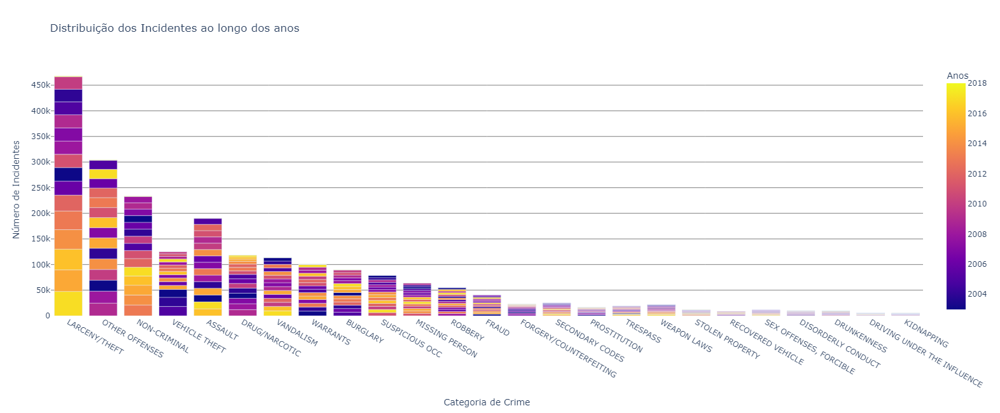

In [57]:
# Agrupar os dados pela categoria de crime a cada ano
grouped_data = df.groupby(['category', 'year']).size().reset_index(name='count')

# Selecionar as top 10 categorias de crimes mais comuns
top_10_categories = df['category'].value_counts().nlargest(25).index
grouped_data = grouped_data[grouped_data['category'].isin(top_10_categories)]

# Definir uma paleta de 17 cores distintas
custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', 
                 '#FF6692', '#B6E880', '#FF97FF', '#FECB52', '#1F77B4', '#FF7F0E', 
                 '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2']

# Criar o gráfico de barras empilhadas com Plotly
fig = px.bar(grouped_data.sort_values(by='count', ascending=False), 
             x='category', 
             y='count',
             color='year', 
             title='Distribuição dos Incidentes ao longo dos anos',
             labels={'category': 'Categoria de Crime', 'count': 'Número de Incidentes', 'year': 'Anos'},
             color_discrete_sequence=custom_colors)  # Você pode escolher outras sequências de cores

# Personalizar o layout
fig.update_layout(barmode='stack',
                  height=650,
                  xaxis_title='Categoria de Crime',
                  yaxis_title='Número de Incidentes',
                  plot_bgcolor='white', 
                  yaxis=dict(showgrid=True, gridcolor='gray'))

# Exibir o gráfico
fig.show()

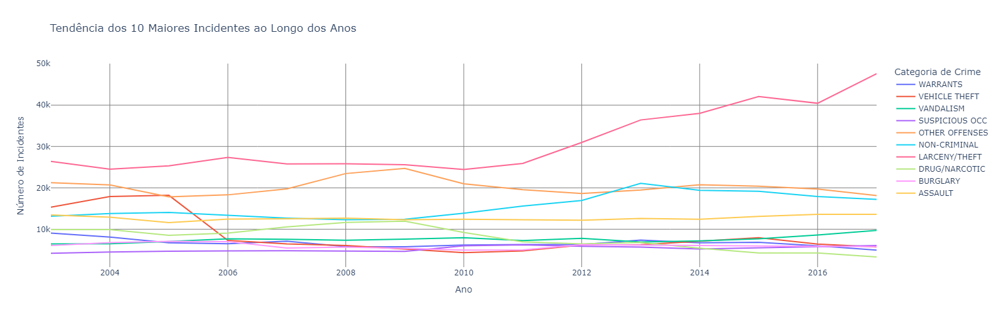

In [58]:
# Selecionar as top 10 categorias de crimes mais comuns
top_10_categories = df['category'].value_counts().nlargest(10).index

# Filtrar o DataFrame para essas categorias
filtered_data = df[df['category'].isin(top_10_categories)]

# Excluir o ano de 2018
filtered_data = filtered_data[filtered_data['year'] < 2018]

# Agrupar os dados por ano e categoria de crime
yearly_trends = filtered_data.groupby(['year', 'category']).size().reset_index(name='count')

# Criar o gráfico de linhas com Plotly
fig = px.line(yearly_trends.sort_values(by=['category', 'year'], ascending=False),
              x='year', 
              y='count', 
              color='category', 
              title='Tendência dos 10 Maiores Incidentes ao Longo dos Anos',
              labels={'year': 'Ano', 'count': 'Número de Incidentes', 'category': 'Categoria de Crime'})

# Personalizar o layout
fig.update_layout(height=500, 
                  xaxis_title='Ano', 
                  yaxis_title='Número de Incidentes',
                  legend_title_text='Categoria de Crime',
                  plot_bgcolor='white',  # Define o fundo do gráfico como branco
                  xaxis=dict(showgrid=True, gridcolor='gray'),  # Manter o grid do eixo x
                  yaxis=dict(showgrid=True, gridcolor='gray'))  # Manter o grid do eixo y

# Exibir o gráfico
fig.show()


### Distribuição dos Incidentes ao longo dos Meses

In [60]:
import calendar

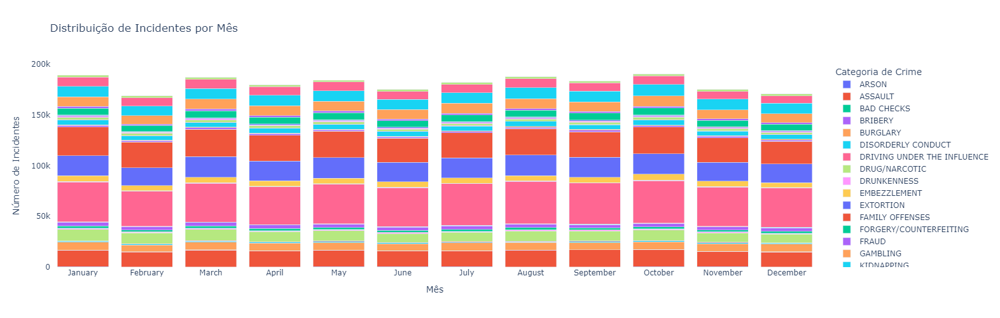

In [61]:
# Criar um mapeamento entre números e nomes dos meses
month_names = {i: calendar.month_name[i] for i in range(1, 13)}

# Agrupar os dados por mês e categoria de crime
monthly_data = df.groupby(['month', 'category']).size().reset_index(name='count')

# Substituir os números dos meses pelos nomes
monthly_data['month'] = monthly_data['month'].map(month_names)

# Criar o gráfico de barras empilhadas com nomes dos meses
fig = px.bar(monthly_data, 
             x='month', 
             y='count', 
             color='category',
             title='Distribuição de Incidentes por Mês',
             labels={'month': 'Mês', 'count': 'Número de Incidentes', 'category': 'Categoria de Crime'})

# Personalizar o layout
fig.update_layout(barmode='stack', 
                  height=500, 
                  xaxis_title='Mês', 
                  yaxis_title='Número de Incidentes',
                  legend_title_text='Categoria de Crime',
                  plot_bgcolor='white')

# Exibir o gráfico
fig.show()

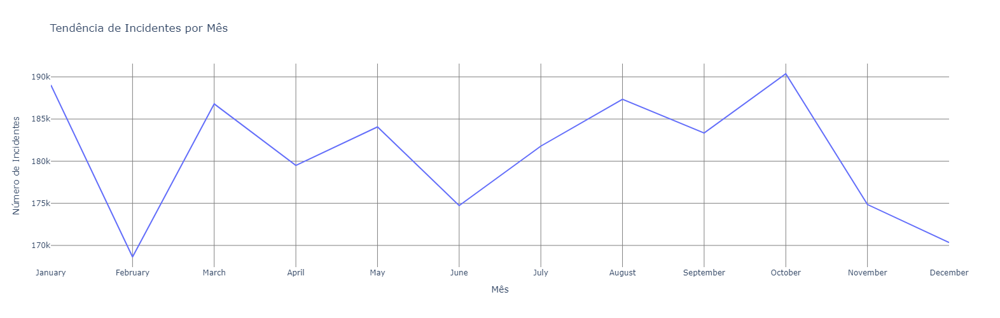

In [62]:
# Agrupar os dados por mês
monthly_trend = df.groupby('month').size().reset_index(name='count')

# Substituir os números dos meses pelos nomes
monthly_trend['month'] = monthly_trend['month'].map(month_names)

# Criar o gráfico de linha com nomes dos meses
fig = px.line(monthly_trend, 
              x='month', 
              y='count', 
              title='Tendência de Incidentes por Mês',
              labels={'month': 'Mês', 'count': 'Número de Incidentes'})

# Personalizar o layout
fig.update_layout(height=500, 
                  xaxis_title='Mês', 
                  yaxis_title='Número de Incidentes',
                  plot_bgcolor='white',  # Define o fundo do gráfico como branco
                  xaxis=dict(showgrid=True, gridcolor='gray'),  # Remove o grid do eixo x
                  yaxis=dict(showgrid=True, gridcolor='gray'))  # Remove o grid do eixo y)

# Exibir o gráfico
fig.show()

### Distribuição de Furtos ao Longo das Horas, Meses e Anos
- Com esses gráficos será possível entender quais horários temos mais furtos, quais meses e anos foram tiveram um aumento ou diminuição de casos.

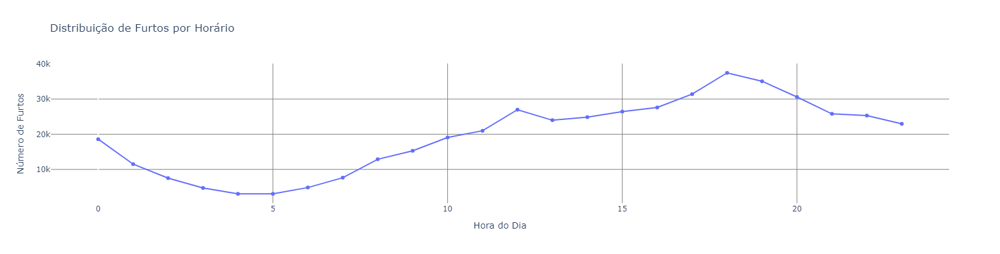

In [64]:
# Filtrar apenas furtos
theft_data = df[df['category'] == 'LARCENY/THEFT']

# Extrair a hora do timestamp
theft_data['hour'] = pd.to_datetime(theft_data['time']).dt.hour

# Contar o número de furtos por hora
hourly_theft = theft_data.groupby('hour').size().reset_index(name='count')

# Criar um gráfico de linha para mostrar a distribuição horária
fig = px.line(hourly_theft, x='hour', y='count',
              title='Distribuição de Furtos por Horário',
              labels={'hour': 'Hora do Dia', 'count': 'Número de Furtos'},
              markers=True)

# Personalizar o layout
fig.update_layout(height=400,
                  xaxis_title='Hora do Dia',
                  yaxis_title='Número de Furtos',
                  plot_bgcolor='white',  # Define o fundo do gráfico como branco
                  xaxis=dict(showgrid=True, gridcolor='gray'),  # Remove o grid do eixo x
                  yaxis=dict(showgrid=True, gridcolor='gray'))
fig.show()

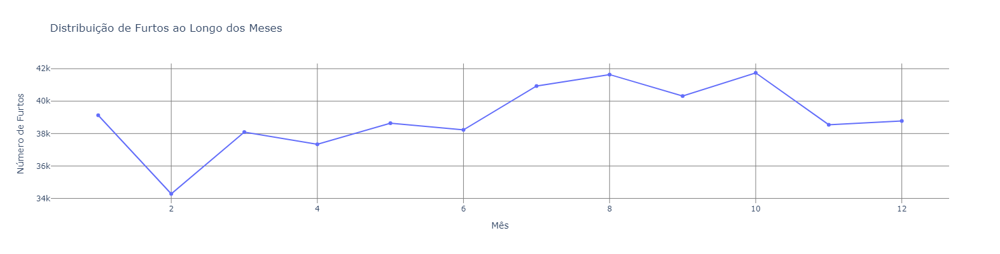

In [65]:
# Contar o número de furtos por mês
monthly_theft = theft_data.groupby('month').size().reset_index(name='count')

# Criar um gráfico de linha para mostrar a distribuição mensal
fig = px.line(monthly_theft, x='month', y='count',
              title='Distribuição de Furtos ao Longo dos Meses',
              labels={'month': 'Mês', 'count': 'Número de Furtos'},
              markers=True)

# Personalizar o layout
fig.update_layout(height=400,
                  xaxis_title='Mês',
                  yaxis_title='Número de Furtos',
                  plot_bgcolor='white',  # Define o fundo do gráfico como branco
                  xaxis=dict(showgrid=True, gridcolor='gray'),  # Remove o grid do eixo x
                  yaxis=dict(showgrid=True, gridcolor='gray'))
fig.show()

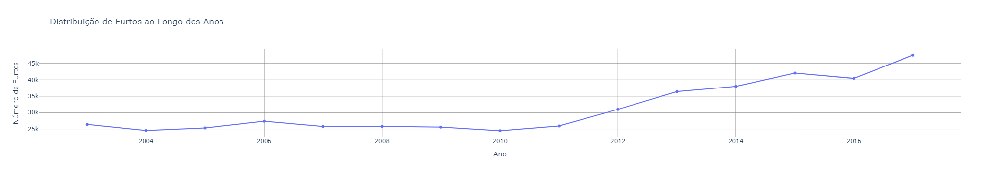

In [66]:
# Contar o número de furtos por ano
yearly_theft = theft_data[theft_data['year'] < 2018].groupby('year').size().reset_index(name='count')

# Criar um gráfico de linha para mostrar a distribuição anual
fig = px.line(yearly_theft, x='year', y='count',
              title='Distribuição de Furtos ao Longo dos Anos',
              labels={'year': 'Ano', 'count': 'Número de Furtos'},
              markers=True)

# Personalizar o layout
fig.update_layout(height=400,
                  xaxis_title='Ano',
                  yaxis_title='Número de Furtos',
                  plot_bgcolor='white',  # Define o fundo do gráfico como branco
                  xaxis=dict(showgrid=True, gridcolor='gray'),  # Remove o grid do eixo x
                  yaxis=dict(showgrid=True, gridcolor='gray'))
fig.show()

### Conclusões:
- Em relação as horas, percebe-se que durante a madrugada o número de furtos diminui, muito provavelmente devido a maioria das pessoas já estarem em suas casas, porém a partir das `5 horas` da manhã os valores começam a aumentar, notoriamente a partir das `16 horas` o número entra em seu último ciclo de alta até o `topo` às `18 horas` onde ocorreram 37 mil furtos.
- Em relação aos meses, de de `Junho` a `Agosto` temos um aumento no número de furtos porém em `Setembro` volta a cair para novamente em `Outubro` termos o topo, com mais de 41 mil furtos.
- Em relação aos anos de `2003` a `2010` percebe-se um momento de lateralização do gráfico em que o número de furtos se mantém estável sem nenhuma melhora ou piora relevante, porém de `2010` a `2017` inicia-se um ciclo de alta no número de furtos, o ano de `2018` devido a limitações na quantidade de registros foi excluído das análises.

In [68]:
df.head(1)

,unique_key,pdid,category,descript,resolution,pddistrict,address,number,street,longitude,latitude,location,timestamp,dayofweek,time,day,month,year,is_weekend
0,100201225,10020122509164,FRAUD,"ACCESS CARD INFORMATION, THEFT OF",NONE,PARK,1400 Block of WALLER ST,1400,WALLER,-122.447968,37.768863,"(37.768862804, -122.44796773714)",2010-02-25 20:00:00+00:00,Thursday,20:00:00,25,2,2010,0


## Análises Geográficas
- Utilizarei as features de latitude e longitude para criar mapas e realizarmos analises dos locais com maior número de incidências.

### Mapa de Tendências Temporais
Esse mapa animado mostra como a distribuição de crimes muda ao longo do tempo.

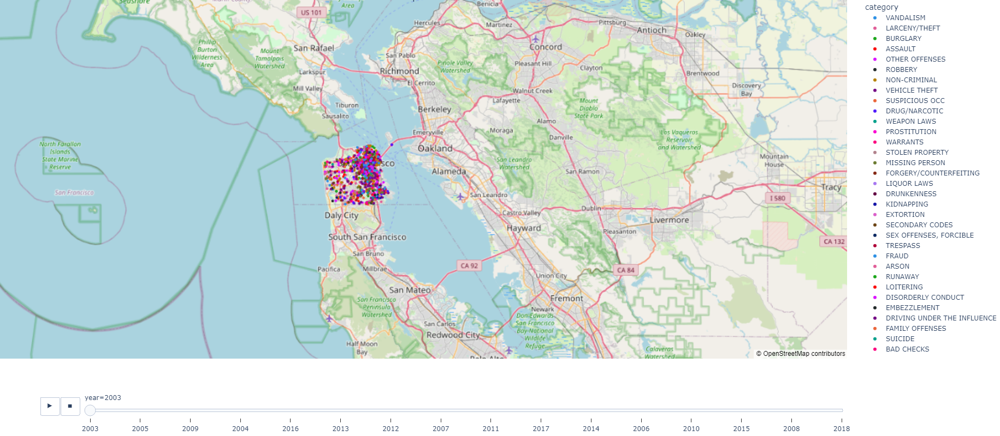

In [71]:
# Criar o mapa animado ao longo do tempo
fig = px.scatter_mapbox(data_frame=df.sample(round(len(df)*0.01)), 
                        lat='latitude', 
                        lon='longitude', 
                        hover_name='category', 
                        hover_data=['descript', 'address'],
                        color='category',
                        animation_frame='year',
                        color_discrete_sequence=px.colors.qualitative.Dark24,
                        zoom=10, 
                        height=600)

# Configurar o mapa com estilo open-street-map
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(height=800,  # Ajuste a altura conforme necessário
                  width=1200,  # Ajuste a largura conforme necessário
                  title=dict(text="Mapa de Calor de Crimes em São Francisco", x=0.5))
# Exibir o mapa
fig.show()

### Conclusões:
- Nesse mapa interativo é possível navegar separadamente ano a ano todos os incidentes que ocorreram na cidade e obter mais informações osbre sua categoria e descrições.

### Mapa de Calor dos locais com maior criminalidade
Nesta etapa será criado um mapa de calor diretamente com as coordenadas de latitude e longitude, que não requer um GeoJSON.

Aqui está um exemplo de como criar um mapa de calor:

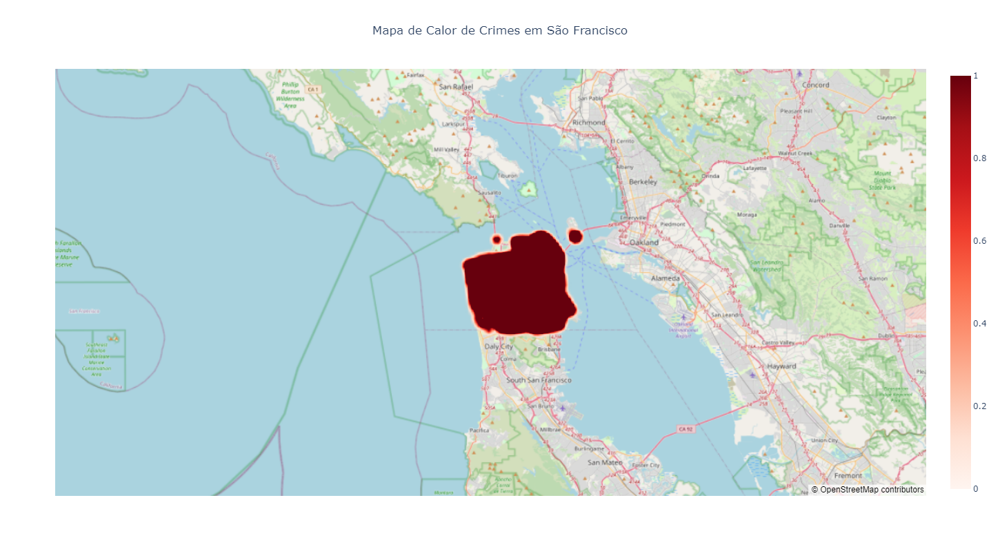

In [74]:
import plotly.express as px

# Criar o mapa de calor com Plotly
fig = px.density_mapbox(df.sample(round(len(df)*0.01)),
                        lat='latitude',
                        lon='longitude',
                        radius=10,
                        center={"lat": 37.7749, "lon": -122.4194},
                        zoom=10,
                        color_continuous_scale="Reds",
                        mapbox_style="open-street-map",  # Usar OpenStreetMap em vez de Mapbox
                        title="Mapa de Calor de Crimes em São Francisco")

# Ajustar o layout
fig.update_layout(
    height=800,  # Ajuste a altura conforme necessário
    width=1200,  # Ajuste a largura conforme necessário
    title=dict(text="Mapa de Calor de Crimes em São Francisco",
               x=0.5))
fig.show()

### Conclusões:
- Nesse mapa é possível notar diversos pontos de incidentes em crimes, a parte leste do mapa mostra uma quantidade bastante elevada de crimes se comparada a parte oeste, com um grande foco na parte nordeste, bairros como `Civic Center`, ruas como `Turk Street` e `6th Street` diversos incidentes ocorreram ao longo dos anos.

### Salvando alterações

In [77]:
df.to_csv('sfpd_incidents.csv', index=False)

In [78]:
df = pd.read_csv('sfpd_incidents.csv')

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2170784 entries, 0 to 2170783
Data columns (total 19 columns):
 #   Column      Dtype  
---  ------      -----  
 0   unique_key  int64  
 1   pdid        int64  
 2   category    object 
 3   descript    object 
 4   resolution  object 
 5   pddistrict  object 
 6   address     object 
 7   number      object 
 8   street      object 
 9   longitude   float64
 10  latitude    float64
 11  location    object 
 12  timestamp   object 
 13  dayofweek   object 
 14  time        object 
 15  day         int64  
 16  month       int64  
 17  year        int64  
 18  is_weekend  int64  
dtypes: float64(2), int64(6), object(11)
memory usage: 314.7+ MB


# 5. Segmentando a base com K-Means
- Nessa etapa irei realizar algumas features engineerings adicionais a título de buscar um algorítimo mais acurado;
- Pré-processamentos;
- Execução do algoritmo;
- Visualização dos clusters;
- Rotulação da base.

In [81]:
df.drop(['unique_key','pdid'], axis='columns', inplace=True)

In [82]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['hour'] = df['timestamp'].dt.hour

In [83]:
def categorize_time(hour):
    if 0 <= hour < 6:
        return 'Early Morning'
    elif 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

df['time_category'] = df['hour'].apply(categorize_time)

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2170784 entries, 0 to 2170783
Data columns (total 19 columns):
 #   Column         Dtype              
---  ------         -----              
 0   category       object             
 1   descript       object             
 2   resolution     object             
 3   pddistrict     object             
 4   address        object             
 5   number         object             
 6   street         object             
 7   longitude      float64            
 8   latitude       float64            
 9   location       object             
 10  timestamp      datetime64[ns, UTC]
 11  dayofweek      object             
 12  time           object             
 13  day            int64              
 14  month          int64              
 15  year           int64              
 16  is_weekend     int64              
 17  hour           int32              
 18  time_category  object             
dtypes: datetime64[ns, UTC](1), float64(2), int

In [85]:
df.sample(1)

,category,descript,resolution,pddistrict,address,number,street,longitude,latitude,location,timestamp,dayofweek,time,day,month,year,is_weekend,hour,time_category
436984,ASSAULT,BATTERY,NONE,SOUTHERN,200 Block of KING ST,200,KING,-122.392773,37.777087,"(37.7770867759344, -122.392773013909)",2005-11-17 18:14:00+00:00,Thursday,18:14:00,17,11,2005,0,18,Evening


In [86]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer

In [87]:
# 1. Pipeline de Pré-processamento
numeric_features = ['longitude', 'latitude', 'day', 'month', 'year', 'is_weekend', 'hour']
categorical_features = ['category', 'descript', 'resolution', 'pddistrict', 'dayofweek', 'time_category']

numeric_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
                                          ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(transformers=[('numeric_transform', numeric_transformer, numeric_features),
                                               ('categoric_transform', categorical_transformer, categorical_features)])

In [88]:
df.isnull().sum()

category         0
descript         0
resolution       0
pddistrict       0
address          0
number           0
street           0
longitude        0
latitude         0
location         0
timestamp        0
dayofweek        0
time             0
day              0
month            0
year             0
is_weekend       0
hour             0
time_category    0
dtype: int64

In [89]:
# Transformação dos dados antes de aplicar o KMeans
df_sample = df.sample(int(len(df) * 0.05))
df_transformed = preprocessor.fit_transform(df_sample)

In [90]:
# Converter matriz esparsa para matriz densa
df_dense = df_transformed.toarray()

# Verifique as dimensões da matriz densa
print("Dimensões da matriz densa:", df_dense.shape)

Dimensões da matriz densa: (108539, 808)


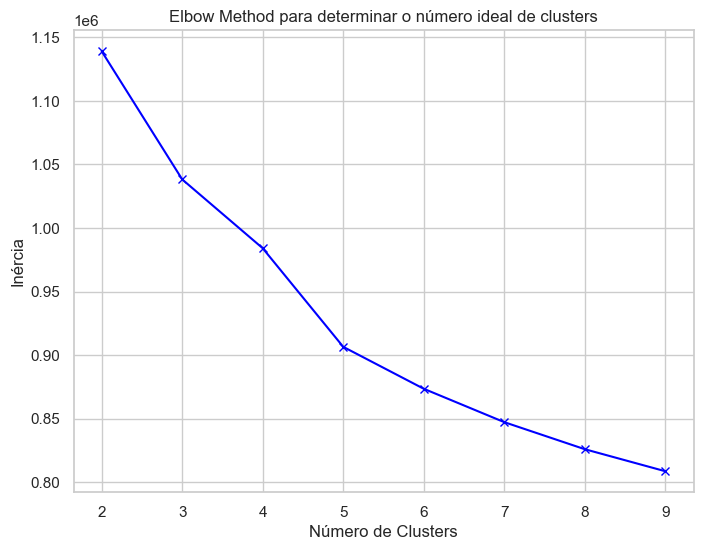

In [91]:
inertias = []
k_values = range(2, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(df_dense)
    inertias.append(kmeans.inertia_)

# Plot do Elbow Method
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertias, 'bx-')
plt.xlabel('Número de Clusters')
plt.ylabel('Inércia')
plt.title('Elbow Method para determinar o número ideal de clusters')
plt.show()

In [92]:
# Com base no gráfico, escolha um intervalo razoável para `n_clusters`, por exemplo:
optimal_k_range = range(2, 10)  # Ajuste conforme o "cotovelo" no gráfico

# 3. GridSearchCV com intervalo refinado de `n_clusters`
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('kmeans', KMeans(n_init=10))])

param_grid = {'kmeans__n_clusters': optimal_k_range,  # Usa o intervalo refinado do Elbow Method
              'kmeans__init': ['k-means++', 'random'],  # Testa diferentes métodos de inicialização dos centroids
             'kmeans__max_iter': [300, 500]}  # Testa diferentes números máximos de iterações

grid_search = GridSearchCV(pipeline, param_grid, cv=5)
grid_search.fit(df)

# Melhor número de clusters e pipeline ajustado
print(f"Best number of clusters: {grid_search.best_params_['kmeans__n_clusters']}")

Best number of clusters: 9


### Rotulando a base
- Escolherei o número de clusters que foram recomendados pela tunagem de hiperparâmetros para rotular a base.

In [94]:
# Ajustar o preprocessor na amostra
preprocessed_sample = preprocessor.fit_transform(df_sample)

# Aplicar o KMeans com número de clusters recomendado
kmeans = KMeans(n_clusters=grid_search.best_params_['kmeans__n_clusters'],
                n_init=10,
                random_state=42)

kmeans.fit(preprocessed_sample)

# Pré-processar o DataFrame completo
preprocessed_full = preprocessor.transform(df)

# Rotular o DataFrame completo usando o modelo treinado na amostra
df['cluster_label'] = kmeans.predict(preprocessed_full)

# Visualizar os primeiros rótulos
print(df['cluster_label'].head())

0    2
1    1
2    3
3    8
4    1
Name: cluster_label, dtype: int32


In [95]:
df.to_csv('sfpd_incidents.csv', index=False)

In [96]:
df = pd.read_csv('sfpd_incidents.csv')

# 6. Definição da Arquitetura, Criação da Rede e Execução do Modelo

| Camada                | Neurônios | Função de Ativação | Observações                          |
|-----------------------|-----------|--------------------|--------------------------------------|
| **Entrada**           | 69       | -                  |  69 Features de entrada               |
| **Primeira Oculta**   | 256       | ReLU               | Início com 256 neurônios             |
| **Segunda Oculta**    | 128       | ReLU               | Redução para 128 neurônios           |
| **Terceira Oculta**   | 64        | ReLU               | Redução para 64 neurônios            |
| **Quarta Oculta**     | 32        | ReLU               | Redução para 32 neurônios            |
| **Saída**             | 9         | Softmax            | Classificação Multiclasse                |

### Função de Perda e Otimizador
- Função de Perda: `Sparse Categorical Crossentropy`
- Otimizador: `Adam`

### Número de Epochs
- Epochs: 50

In [99]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

In [100]:
df.sample(1)

,category,descript,resolution,pddistrict,address,number,street,longitude,latitude,location,timestamp,dayofweek,time,day,month,year,is_weekend,hour,time_category,cluster_label
522876,BURGLARY,"BURGLARY,RESIDENCE UNDER CONSTRT, UNLAWFUL ENTRY",NONE,NORTHERN,1800 Block of PACIFIC AV,1800,PACIFIC,-122.42572,37.794555,"(37.7945546414296, -122.425719698405)",2004-10-07 18:00:00+00:00,Thursday,18:00:00,7,10,2004,0,18,Evening,5


### Redução de dimensionalidade
- Para o encoding da variável categórica 'descript' irei aplicar um agrupamento por frequência para reduzirmos a quantidade de variáveis que serão passadas ao modelo, se eu não fizer isso o encoding irá criar 915 variáveis distintas para as descrições dos crimes e a execução do algorítmo será interrompida por falta de memória.

In [102]:
display(len(df['category'].value_counts()))
df['category'].value_counts().head(10)

39

category
LARCENY/THEFT     467656
OTHER OFFENSES    304042
NON-CRIMINAL      233323
ASSAULT           190394
VEHICLE THEFT     125209
DRUG/NARCOTIC     118260
VANDALISM         113436
WARRANTS           99799
BURGLARY           89528
SUSPICIOUS OCC     78823
Name: count, dtype: int64

In [103]:
df['descript'].value_counts().head(10)

descript
GRAND THEFT FROM LOCKED AUTO             173078
LOST PROPERTY                             76517
BATTERY                                   66332
STOLEN AUTOMOBILE                         64062
DRIVERS LICENSE, SUSPENDED OR REVOKED     62124
WARRANT ARREST                            55460
AIDED CASE, MENTAL DISTURBED              55112
SUSPICIOUS OCCURRENCE                     51747
PETTY THEFT FROM LOCKED AUTO              50976
PETTY THEFT OF PROPERTY                   44655
Name: count, dtype: int64

In [104]:
# Definir um limiar para agrupar descrições raras
limiar_category = 75000  # Categorias com menos de 10000 ocorrências serão agrupadas
category_counts = df['category'].value_counts()
category_rare = category_counts[category_counts < limiar_category].index

# Substituir descrições raras por "Outras Descrições"
df['category_reduzido'] = df['category'].replace(category_rare, 'Outras Categorias')

In [105]:
# Definir um limiar para agrupar descrições raras
limiar_description = 50000  # Categorias com menos de 10000 ocorrências serão agrupadas
descriptions_counts = df['descript'].value_counts()
descriptions_rare = descriptions_counts[descriptions_counts < limiar_description].index

# Substituir descrições raras por "Outras Descrições"
df['descript_reduzido'] = df['descript'].replace(descriptions_rare, 'Outras Descrições')

In [106]:
categorical_columns = ['category_reduzido', 'resolution', 'pddistrict', 'dayofweek', 'time_category', 'descript_reduzido']

In [107]:
# Passo 1: One-Hot Encoding das colunas categóricas
df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=True)

In [108]:
df_encoded.sample(3)

,category,descript,address,number,street,longitude,latitude,location,timestamp,time,day,month,year,is_weekend,hour,cluster_label,category_reduzido_BURGLARY,category_reduzido_DRUG/NARCOTIC,category_reduzido_LARCENY/THEFT,category_reduzido_NON-CRIMINAL,category_reduzido_OTHER OFFENSES,category_reduzido_Outras Categorias,category_reduzido_SUSPICIOUS OCC,category_reduzido_VANDALISM,category_reduzido_VEHICLE THEFT,category_reduzido_WARRANTS,"resolution_ARREST, CITED",resolution_CLEARED-CONTACT JUVENILE FOR MORE INFO,resolution_COMPLAINANT REFUSES TO PROSECUTE,resolution_DISTRICT ATTORNEY REFUSES TO PROSECUTE,resolution_EXCEPTIONAL CLEARANCE,resolution_JUVENILE ADMONISHED,resolution_JUVENILE BOOKED,resolution_JUVENILE CITED,resolution_JUVENILE DIVERTED,resolution_LOCATED,resolution_NONE,resolution_NOT PROSECUTED,resolution_PROSECUTED BY OUTSIDE AGENCY,resolution_PROSECUTED FOR LESSER OFFENSE,resolution_PSYCHOPATHIC CASE,resolution_UNFOUNDED,pddistrict_CENTRAL,pddistrict_INGLESIDE,pddistrict_MISSION,pddistrict_NORTHERN,pddistrict_PARK,pddistrict_RICHMOND,pddistrict_SOUTHERN,pddistrict_TARAVAL,pddistrict_TENDERLOIN,dayofweek_Monday,dayofweek_Saturday,dayofweek_Sunday,dayofweek_Thursday,dayofweek_Tuesday,dayofweek_Wednesday,time_category_Early Morning,time_category_Evening,time_category_Morning,descript_reduzido_BATTERY,"descript_reduzido_DRIVERS LICENSE, SUSPENDED OR REVOKED",descript_reduzido_GRAND THEFT FROM LOCKED AUTO,descript_reduzido_LOST PROPERTY,descript_reduzido_Outras Descrições,descript_reduzido_PETTY THEFT FROM LOCKED AUTO,descript_reduzido_STOLEN AUTOMOBILE,descript_reduzido_SUSPICIOUS OCCURRENCE,descript_reduzido_WARRANT ARREST
1836918,LARCENY/THEFT,GRAND THEFT FROM PERSON,900 Block of MARKET ST,900,MARKET,-122.408421,37.783570,"(37.7835699386918, -122.408421116922)",2009-07-30 18:30:00+00:00,18:30:00,30,7,2009,0,18,2,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False
1645333,VEHICLE THEFT,STOLEN TRUCK,STOCKTON ST / SUTTER ST,Not Informed,STOCKTON ST / SUTTER ST,-122.406959,37.789435,"(37.789434763004, -122.406958660602)",2009-01-03 17:46:00+00:00,17:46:00,3,1,2009,1,17,0,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
463915,LARCENY/THEFT,PETTY THEFT SHOPLIFTING,0 Block of STOCKTON ST,0,STOCKTON,-122.406352,37.786031,"(37.7860311576362, -122.406351834294)",2010-11-17 14:45:00+00:00,14:45:00,17,11,2010,0,14,8,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False


In [109]:
len(df_encoded.columns)

69

### Devido a dificuldades em tempo de execução, selecionarei 5% dos dados para a execução da rede neural
- Aproximadamente 108 mil instâncias serão selecionadas aleatoriamente.

In [111]:
len(df_encoded.sample(int(len(df_encoded) * 0.05)))

108539

In [112]:
df_encoded = df_encoded.sample(int(len(df_encoded) * 0.05))

In [113]:
# Definir X e y
X = df_encoded.drop(['cluster_label','category', 'descript', 'address', 'street', 'number', 'location', 'timestamp', 'time'], axis=1)
y = df_encoded['cluster_label']

In [114]:
from sklearn.model_selection import train_test_split

In [115]:
# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [116]:
X_train.head(1)

,longitude,latitude,day,month,year,is_weekend,hour,category_reduzido_BURGLARY,category_reduzido_DRUG/NARCOTIC,category_reduzido_LARCENY/THEFT,category_reduzido_NON-CRIMINAL,category_reduzido_OTHER OFFENSES,category_reduzido_Outras Categorias,category_reduzido_SUSPICIOUS OCC,category_reduzido_VANDALISM,category_reduzido_VEHICLE THEFT,category_reduzido_WARRANTS,"resolution_ARREST, CITED",resolution_CLEARED-CONTACT JUVENILE FOR MORE INFO,resolution_COMPLAINANT REFUSES TO PROSECUTE,resolution_DISTRICT ATTORNEY REFUSES TO PROSECUTE,resolution_EXCEPTIONAL CLEARANCE,resolution_JUVENILE ADMONISHED,resolution_JUVENILE BOOKED,resolution_JUVENILE CITED,resolution_JUVENILE DIVERTED,resolution_LOCATED,resolution_NONE,resolution_NOT PROSECUTED,resolution_PROSECUTED BY OUTSIDE AGENCY,resolution_PROSECUTED FOR LESSER OFFENSE,resolution_PSYCHOPATHIC CASE,resolution_UNFOUNDED,pddistrict_CENTRAL,pddistrict_INGLESIDE,pddistrict_MISSION,pddistrict_NORTHERN,pddistrict_PARK,pddistrict_RICHMOND,pddistrict_SOUTHERN,pddistrict_TARAVAL,pddistrict_TENDERLOIN,dayofweek_Monday,dayofweek_Saturday,dayofweek_Sunday,dayofweek_Thursday,dayofweek_Tuesday,dayofweek_Wednesday,time_category_Early Morning,time_category_Evening,time_category_Morning,descript_reduzido_BATTERY,"descript_reduzido_DRIVERS LICENSE, SUSPENDED OR REVOKED",descript_reduzido_GRAND THEFT FROM LOCKED AUTO,descript_reduzido_LOST PROPERTY,descript_reduzido_Outras Descrições,descript_reduzido_PETTY THEFT FROM LOCKED AUTO,descript_reduzido_STOLEN AUTOMOBILE,descript_reduzido_SUSPICIOUS OCCURRENCE,descript_reduzido_WARRANT ARREST
17377,-122.400335,37.795014,6,7,2012,0,0,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False


In [ ]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback

In [ ]:
def build_model(hp):
    model = Sequential()
    
    # Camada de entrada
    model.add(Dense(units=hp.Int('units_1', min_value=256, max_value=512, step=64), activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(hp.Float('dropout_1', 0.2, 0.5, step=0.1)))

    # Primeira camada oculta
    model.add(Dense(units=hp.Int('units_2', min_value=128, max_value=256, step=64), activation='relu'))
    model.add(Dropout(hp.Float('dropout_2', 0.2, 0.5, step=0.1)))
    
    # Segunda camada oculta
    model.add(Dense(units=hp.Int('units_3', min_value=64, max_value=128, step=32), activation='relu'))
    model.add(Dropout(hp.Float('dropout_3', 0.2, 0.5, step=0.1)))
    
    # Camada de saída
    model.add(Dense(units=9, activation='softmax'))
    
    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[0.001, 0.0001, 0.00001])),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

In [ ]:
# Definindo o tuner
tuner = kt.RandomSearch(build_model,
                        objective='val_accuracy',
                        max_trials=20,
                        executions_per_trial=5,
                        directory='my_dir',
                        project_name='cluster_classification')

# Resumo da busca
tuner.search_space_summary()

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback

In [ ]:
# Callback para mostrar o último epoch
class PrintLastEpoch(LambdaCallback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch == self.params['epochs'] - 1:
            print(f'Métricas Finais Encontradas:')
            print(f'Final epoch: {epoch + 1}, Loss: {logs["loss"]}, Accuracy: {logs["accuracy"]}, Val Loss: {logs["val_loss"]}, Val Accuracy: {logs["val_accuracy"]}.')
            
# Função que mostrará os resultados do melhor modelo
def best_hyperparameters():
    print(f"A busca por hiperparâmetros está completa.") 
    print(f"O número ideal de unidades na primeira camada densamente conectada é {best_hps.get('neurons')}.") 
    print(f"A taxa de aprendizado ideal para o otimizador é {best_hps.get('learning_rate')}.") 
    print(f"A taxa de dropout ideal é {best_hps.get('dropout_rate')}.")

In [ ]:
# Realizando a busca pelos melhores hiperparâmetros
tuner.search(X_train, y_train,
             epochs=50,
             validation_data=(X_test, y_test),
             verbose=0,
             callbacks=[EarlyStopping(monitor='val_loss', patience=15), PrintLastEpoch()])

# Obtendo os melhores hiperparâmetros
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    
# Print dos melhores hiperparâmetros
best_hyperparameters()

In [ ]:
# Treinando o modelo final com os melhores hiperparâmetros
model = tuner.hypermodel.build()
history = model.fit(X_train, y_train,
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=0,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=15), PrintLastEpoch()])

display(history)

In [ ]:
# Plotando a perda (loss)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotando a acurácia
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Predições
predictions = model.predict(X_test)

# Convertendo as predições para classes
predicted_classes = predictions.argmax(axis=1)
print(predicted_classes[:5])

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# Matriz de Confusão
matriz_confusao = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(6,5))
sns.heatmap(matriz_confusao, annot=True, fmt='d', cmap='RdYlGn', annot_kws={'fontsize': 15})

# Mostrando o relatório de classificação
print(classification_report(y_test, predicted_classes))

# 8. Avaliando os Modelos: Sumários, Métricas e Conclusões.

Gostaria de primeiramente agradecer a Deus por poder realizar mais esse projeto e conhecimento adquirido, a você que viu esse projeto e está lendo essas conclusões, foi um projeto desafiador e incrívelmente satisfatório de se realizar, me senti motivado a cada nova descoberta e pensando nas possibilidades do que pode-se fazer de análises com esses dados e que definitivamente evoluiu de maneira notória minhas habilidades. 

Trabalhar com mais de 2 milhões de instâncias é um desafio, tive diversos problemas, tanto em execução de código como compatibilidade de bibliotecas, mas me sinto motivado pois sei que momentos assim são comuns em minha futura carreira e sou do tipo que aprende e fixa esse aprendizado melhor na prática, tendo erros e corrigindo-os.

Analisar profundamente dados de uma área de conhecimento nova e a união de um algorítmo não-supervisionado com um supervisionado era idéia central desse projeto e foi concluída com sucesso. Em algumas análises tive que escolher amostras aleatórias dos dados devido a diversos problemas de tempo de execução, no entanto, análises geográficas, temporais e distribuição foram realizadas com base nas variáveis já disponíveis e feature engineering.

Na etapa de machine learning enfrentei o maior desafio desse projeto: `Redução de Dimensionalidade`, por se tratar de diversos crimes, diversas descrições e resoluções para esses crimes, estamos falando de milhares de diferentes categorias, que devem ser encodadas para serem entendidas pelo algoritmo. Em algumas abordagens iniciais os dados de treino tinham por volta de 1000 variáveis criadas após o encoding, e fui testando diferentes maneiras de reduzir a quantidade de variáveis que seriam enviadas ao modelo para evitar erros de falta de memória para execução ou tempo excessivo de execução.

Os dados foram clusterizados e rotulados com o `K-Means` (9 clusters distintos geraram 9 rótulos distintos), decidi por criar Pipelines para os pré-processamentos necessários pois facilita e gera um código </i>clean-code</i>, a tunagem de hiperparâmetros foi utilizada com `diferentes métodos de inicialização dos centroides` e `número máximo de iteraçõe`s juntamente com o `método elbow` para encontrarmos o melhor número de clusters.

Com a base rotulada uma rede neural foi criada para classificar esses rótulos e ser capaz de rotular novos incidentes. Esta rede neural foi elaborada também com tunagem de hiperparâmetros (`Learning Rate` - `Dropout Rate`), camadas de `Dropout` e `Early Stopping` e 100 epochs(iterações). Por se tratar de uma classificação multiclasse (9 classes) e as variáveis terem sido encodadas <i>OneHot</i>, a `Sparse Categorical Cross Entropy` foi utilizada.

Por fim gráficos mostrando o aumento taxa de acurácia e diminuição da perda a cada iteração foram criados e métricas de classificação foram geradas para a análise dos resultados. Tivemos resultados de 80% de acurácia com algumas classes chegando a valores acima de 90% das métricas para uma abordagem inicial considero que foi um bom resultado que é passível de melhoras dependendo de quais classes necessitam ser previstas, lembrando que algumas foram excluidas devido a falta de representatividade.

Obrigado novamente,

Gustavo